In [5]:
# BASICS
import xarray as xr
import numpy as np
import pandas as pd
import os
from datetime import datetime

# PLOTS
import matplotlib.pyplot as plt
# from matplotlib.colors import from_levels_and_colors, ListedColormap, LogNorm, Normalize, rgb2hex, SymLogNorm
import matplotlib.ticker as tkr
import cartopy.crs as ccrs

# REGRIDDING
import xesmf as xe

# CUSTOM FUNCTIONS
import utils

import warnings
warnings.filterwarnings('ignore')

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
save_dir = '/home/pfarnole/data/sibd/'

### ASMR - Prepare panArctic 2003-2019 SIBD

In [3]:
for y in range(2003,2020): # Dataset covers 2003-2019
    # 2012 only partially available in source dataset so not suited for sibd calculation
    if y==2012:
        continue
    print(y)
    data = utils.prep_sibd_asmr(y)
    data.to_netcdf(os.path.join(save_dir,f'ASMR_50-85_{y}.nc'))

2003
2004
2005
2006
2007
2008
2009
2010
2011
2013
2014
2015
2016
2017
2018
2019


#### check data

In [ ]:
data = xr.open_mfdataset(asmrdir+"*.nc")
data

<xarray.Dataset>
Dimensions:              (time: 6117, x: 1216, y: 1792)
Coordinates:
  * x                    (x) float64 -3.847e+06 -3.841e+06 ... 3.747e+06
  * y                    (y) float64 -5.347e+06 -5.341e+06 ... 5.847e+06
  * time                 (time) datetime64[ns] 2002-06-01 ... 2019-12-31
Data variables:
    polar_stereographic  (time) |S1 dask.array<chunksize=(30,), meta=np.ndarray>
    z                    (time, y, x) float32 dask.array<chunksize=(30, 1792, 1216), meta=np.ndarray>
Attributes:
    author:       University of Bremen, Gunnar Spreen [gunnar.spreen@uni-brem...
    Conventions:  CF-1.5
    GMT_version:  5.2.1 (r15220) [64-bit] [MP]
    history:      Sun Jun 21 02:48:54 2020: GDAL CreateCopy( /ssmi/www/htdocs...
    info:         AMSRE sea ice concentration based on the ASI algorithm (Spr...
    title:        Produced by grdmath
    GDAL:         GDAL 2.1.3, released 2017/20/01

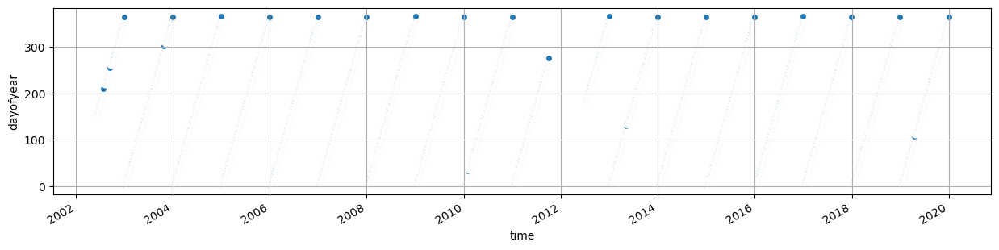

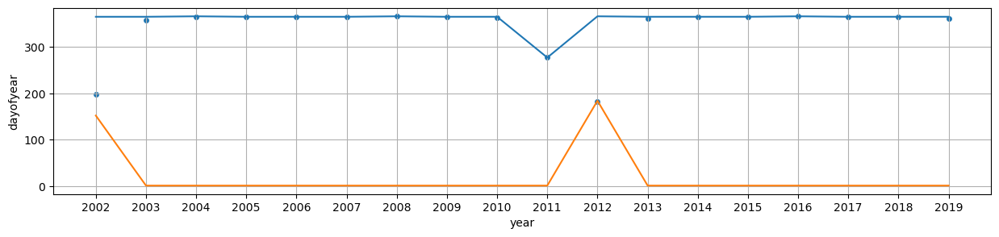

In [43]:
# Check data >> ok for breakup dates except for 2002 and 2012 (missing the first 150 days.
fig, ax = plt.subplots(figsize=(15,3))
data.time.dt.dayofyear.plot.scatter(ax=ax)
ax.grid()
plt.show()

fig, ax = plt.subplots(figsize=(15,3))
data.time.groupby('time.year').count().plot.scatter(ax=ax)
data.time.dt.dayofyear.groupby('time.year').max().plot(ax=ax)
data.time.dt.dayofyear.groupby('time.year').min().plot(ax=ax)
ax.set_xticks(list(range(2002,2020)))
ax.grid()
plt.show()

### NAA - Prepare panArctic 2003-2015 SIBD

In [ ]:
runs = {'DFS':'G510.00','CGRF':'C524.06','JRA':'C524.00-08'}
years = range(2003,2016)

for forcing in ['JRA']: #runs:
    print(forcing)
    for y in range(2018,2023):#years:
        print(y)
        data = utils.prep_sibd_naa(forcing,y)
        data.to_netcdf(os.path.join(save_dir,f'{forcing}_{runs[forcing]}_{y}.nc'))

JRA
2018
2019
2020


In [ ]:
# years = list(data['asmr'].year.data)
# plot_extent = [-140,-110,67,75] #[-180,180,60,90] [-135,-100,67,75]
# central_longitude = 0.5*(plot_extent[0]+plot_extent[1])
# y = 2017
# vmax = None

# fig, axs = plt.subplots(ncols=2,figsize=(10,6),subplot_kw={'projection':ccrs.NorthPolarStereo(central_longitude=central_longitude)})
# fig.suptitle(y)
# for i,k in enumerate(['sibd85','sibd50']):
#     axs[i].coastlines()
#     axs[i].set_title(k)
#     axs[i].set_extent(plot_extent, ccrs.PlateCarree())
#     pl = axs[i].pcolormesh(data['asmr'].lon, data['asmr'].lat, data['asmr'].sel(year=y)[k], transform=ccrs.PlateCarree(),vmin=0,vmax=vmax)
#     plt.colorbar(pl, ax=axs[i],orientation='horizontal', label='doySIbreak',shrink=0.7,pad=0.03)
# fig.tight_layout()
# plt.show()

### LOAD datasets

In [ ]:
for y in range(2003,2016):
    fp_prefix = '/home/pfarnole/data/sibd/DFS_G510.00' # 'JRA_C524.00-08' (2003,2023), 'CGRF_C524.06' (2003,2023)
    data_rn = xr.open_dataset(f'{fp_prefix}_{y}.nc').rename({'nav_lat':'lat','nav_lon':'lon'})
    data_rn.to_netcdf(f'/home/pfarnole/data/sibd/{fp_prefix}_{y}.nc')


In [6]:
data = {}
data['DFS'] = xr.open_mfdataset('/home/pfarnole/data/sibd/DFS_*')
data['CGRF'] = xr.open_mfdataset('/home/pfarnole/data/sibd/CGRF_*')
data['JRA'] = xr.open_mfdataset('/home/pfarnole/data/sibd/JRA_*')
data['ASMR'] = xr.open_mfdataset('/home/pfarnole/data/sibd/ASMR_*')

#### PLOTS

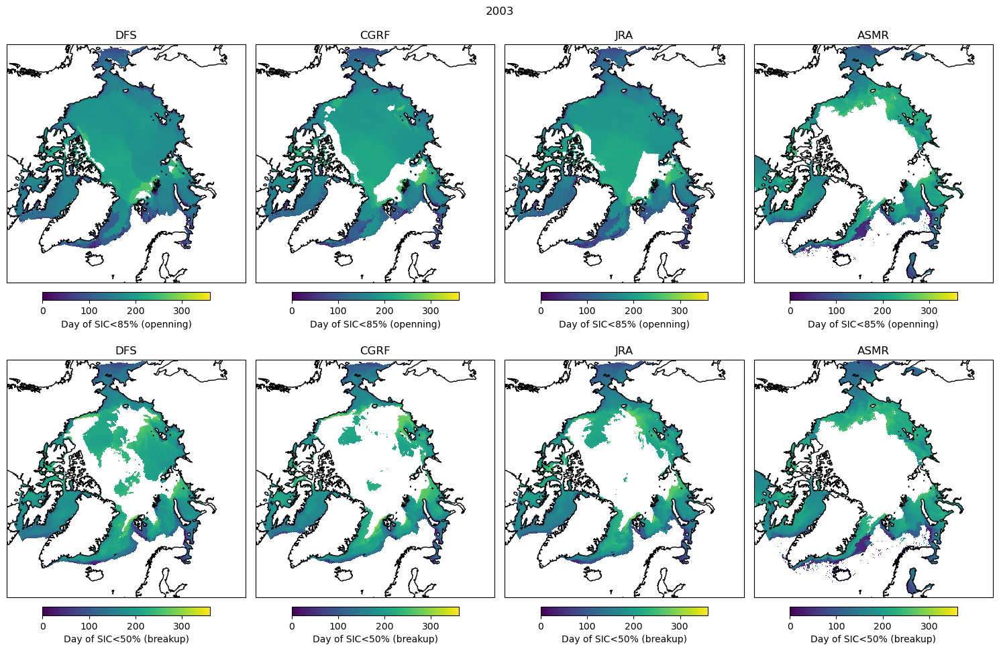

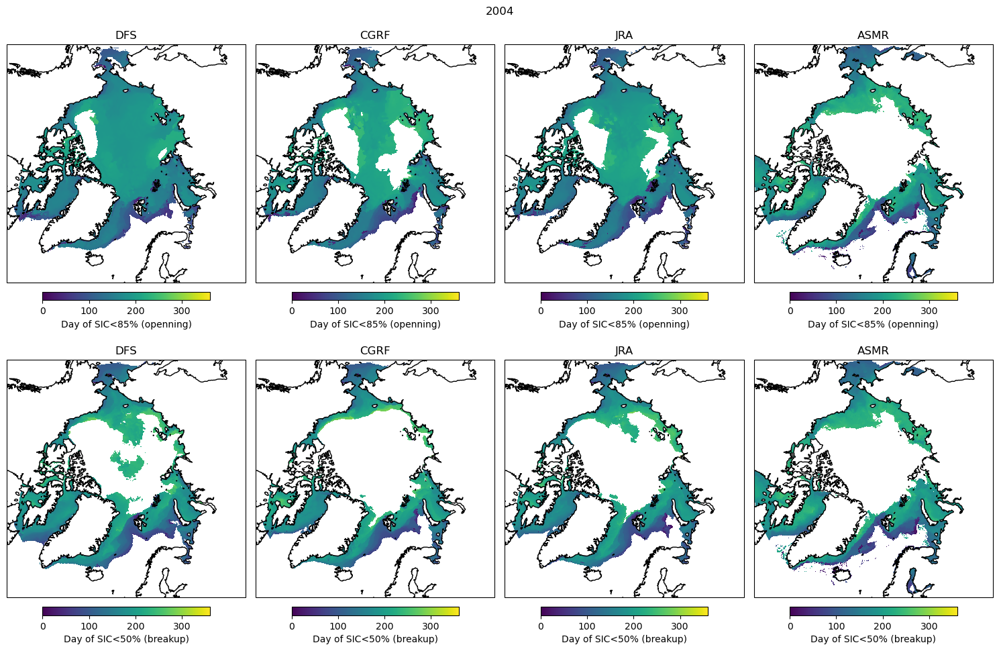

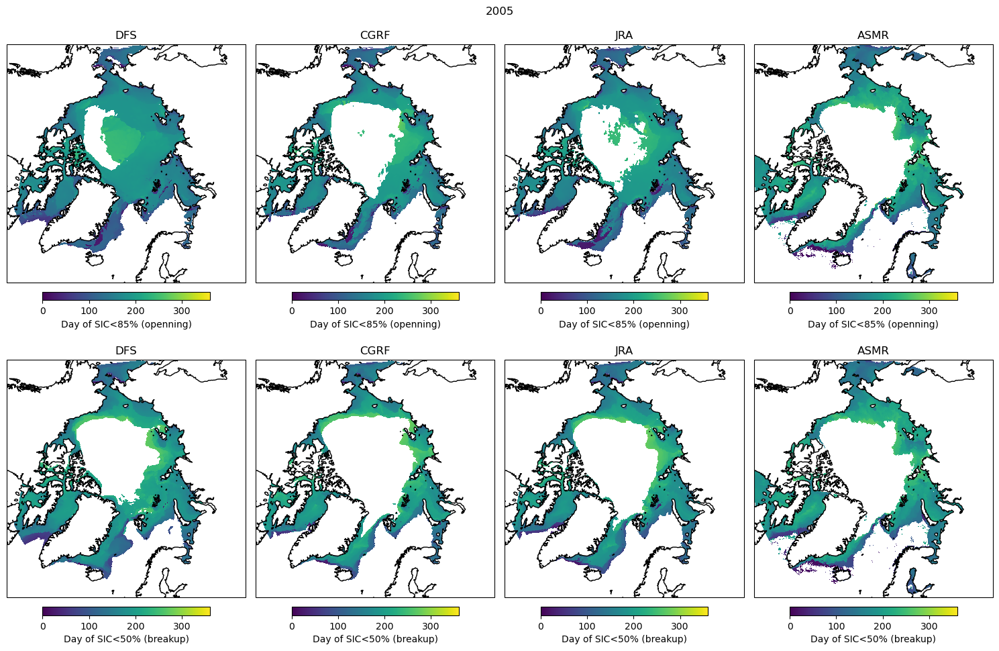

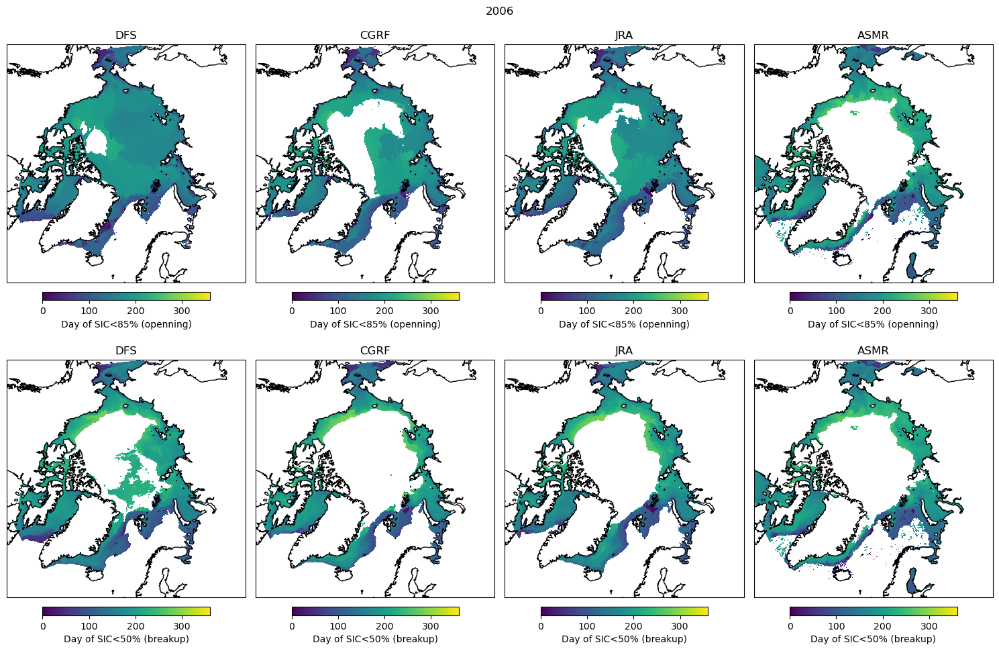

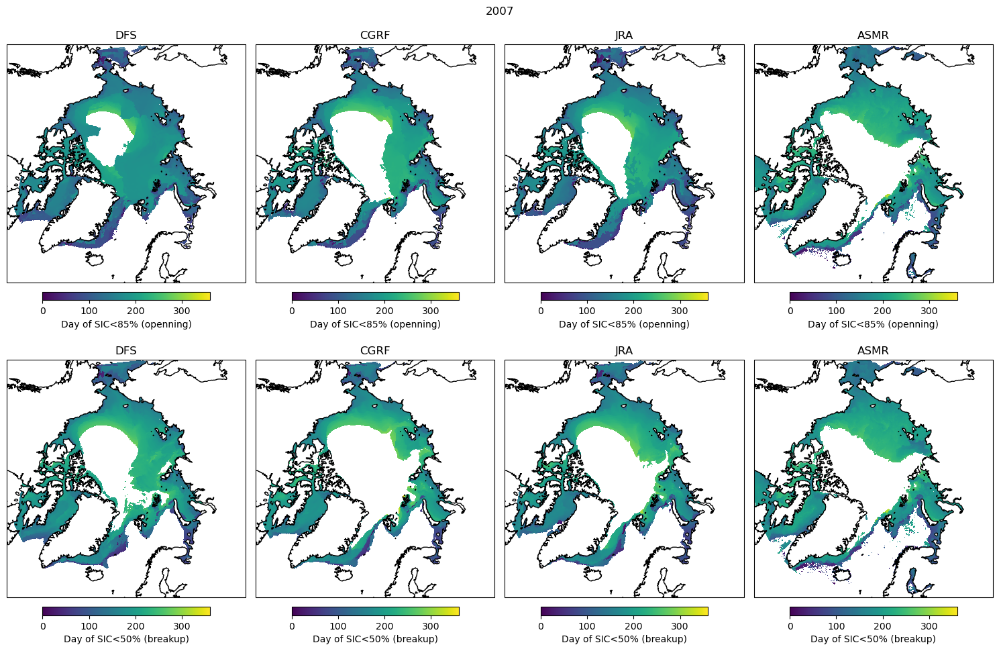

...

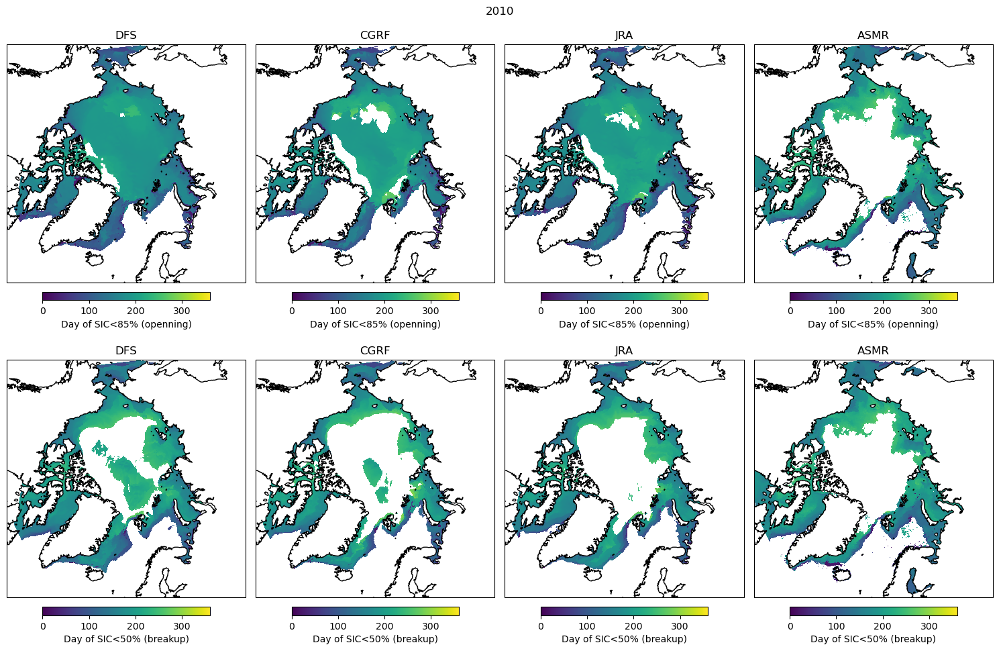

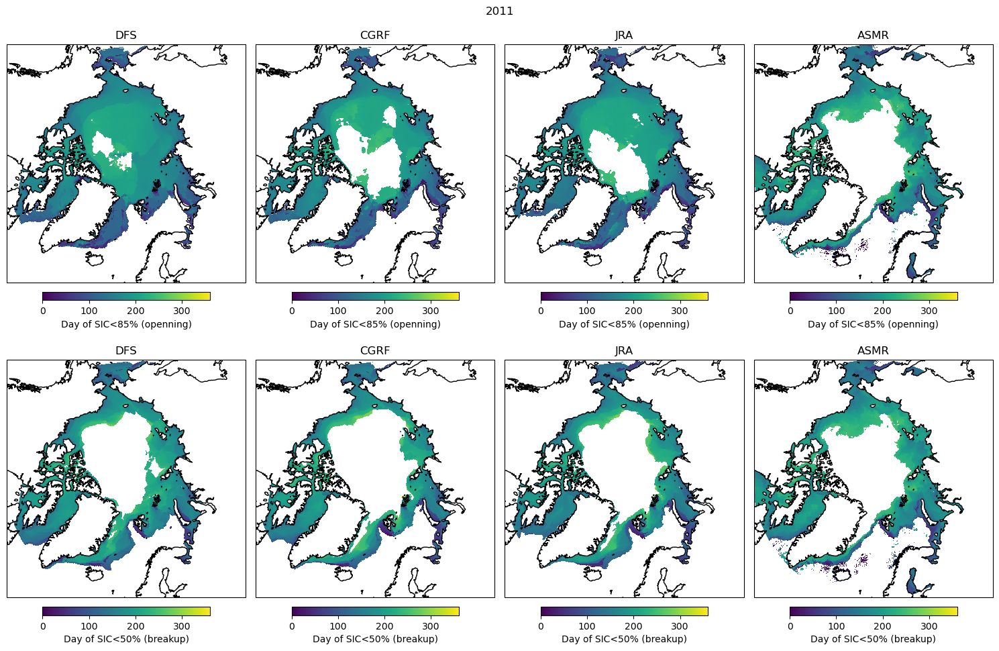

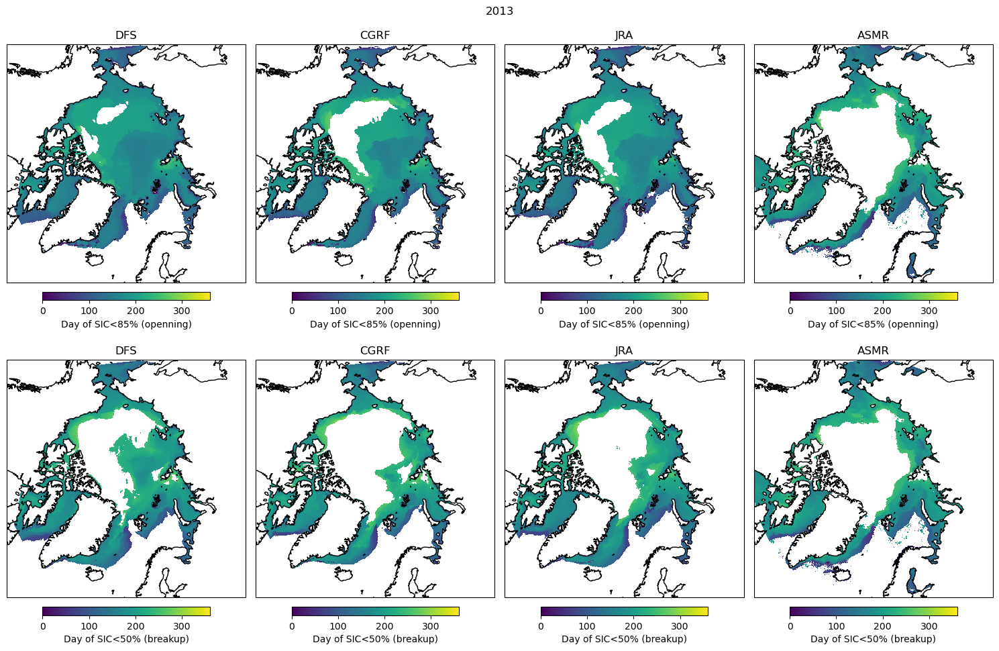

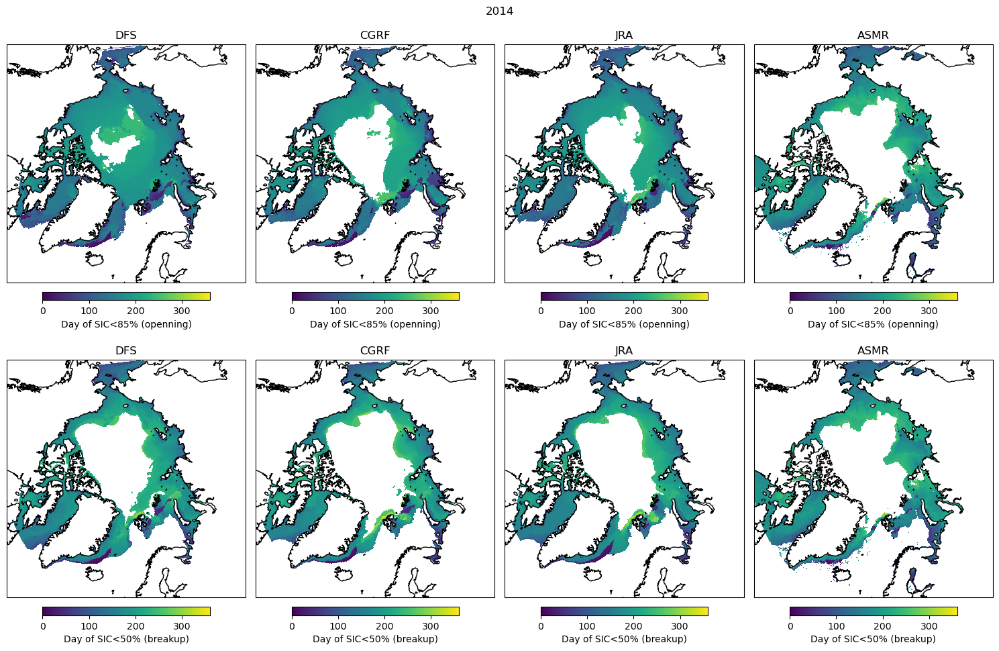

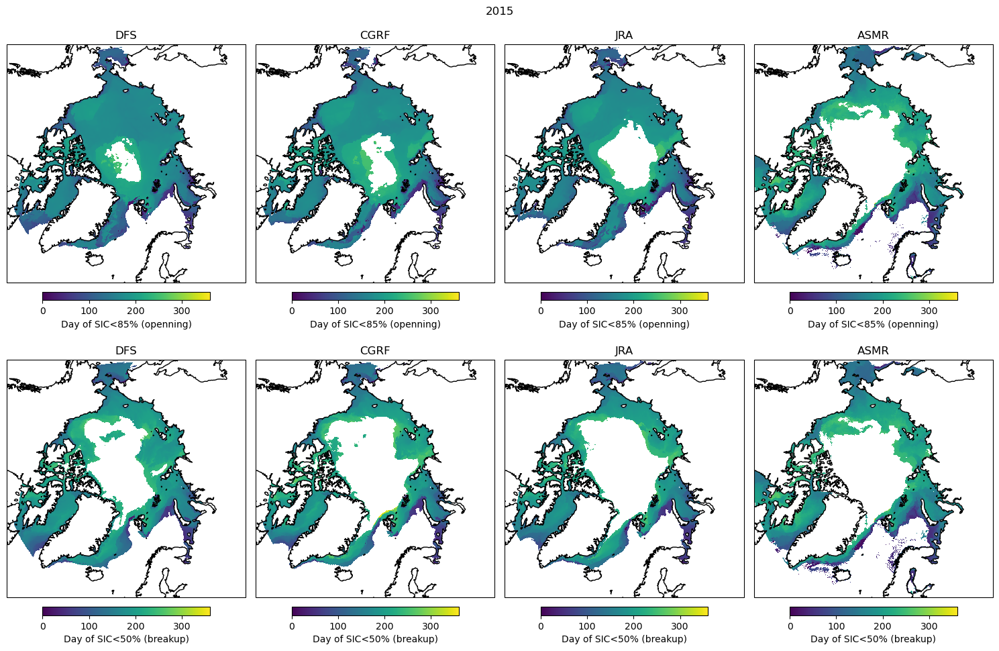

In [11]:
save_prefix = None # '/home/pfarnole/data/sibd/images/panarctic_naa_vs_asmr_sibd50-85'
years = list(range(2003,2012))+list(range(2013,2016))
plot_extent = [-180,180,60,90] # [-140,-110,67,75] # [-150,-100,67,85]   # >> you can change for regional focus
central_longitude = 0.5*(plot_extent[0]+plot_extent[1]) #-90 #

datasets = data.keys() #['DFS','CGRF','JRA','ASMR']
ncols = len(datasets)
vmax = 365 # None

for y in years:
    fig, axs = plt.subplots(nrows=2,ncols=ncols,figsize=(15,10),subplot_kw={'projection':ccrs.NorthPolarStereo(central_longitude=central_longitude)})
    fig.suptitle(y)
    for i,k in enumerate(datasets):
        axs[0,i].coastlines()
        axs[0,i].set_title(k)
        axs[0,i].set_extent(plot_extent, ccrs.PlateCarree())
        axs[1,i].coastlines()
        axs[1,i].set_title(k)
        axs[1,i].set_extent(plot_extent, ccrs.PlateCarree())
        pl0 = axs[0,i].pcolormesh(data[k].lon, data[k].lat, data[k].sibd85.sel(year=y), transform=ccrs.PlateCarree(),vmin=0,vmax=vmax)
        plt.colorbar(pl0, ax=axs[0,i],orientation='horizontal', label='Day of SIC<85% (openning)',shrink=0.7,pad=0.03, format=tkr.FormatStrFormatter('%d'))
        pl1 = axs[1,i].pcolormesh(data[k].lon, data[k].lat, data[k].sibd50.sel(year=y), transform=ccrs.PlateCarree(),vmin=0,vmax=vmax)
        plt.colorbar(pl0, ax=axs[1,i],orientation='horizontal', label='Day of SIC<50% (breakup)',shrink=0.7,pad=0.03, format=tkr.FormatStrFormatter('%d'))
    fig.tight_layout()
    if save_prefix:
        plt.savefig(f'{save_prefix}_{y}.png')
    else:
        plt.show()

#### REGRID

In [17]:
from_dataset,to_dataset = 'DFS','ASMR'
regridder = xe.Regridder(data[from_dataset],data[to_dataset], 'nearest_s2d', periodic=True, ignore_degenerate=True)
data[f'{from_dataset}_regridded'] = regridder(data[from_dataset])

# SAVE
data[f'{from_dataset}_regridded'].to_netcdf(f'/home/pfarnole/data/sibd/{from_dataset}_regridded_to_{to_dataset}.nc')

# # LOAD
# data[f'{from_dataset}_regridded'] = xr.open_dataset(f'/home/pfarnole/data/sibd/{from_dataset}_regridded_to_{to_dataset}.nc')    

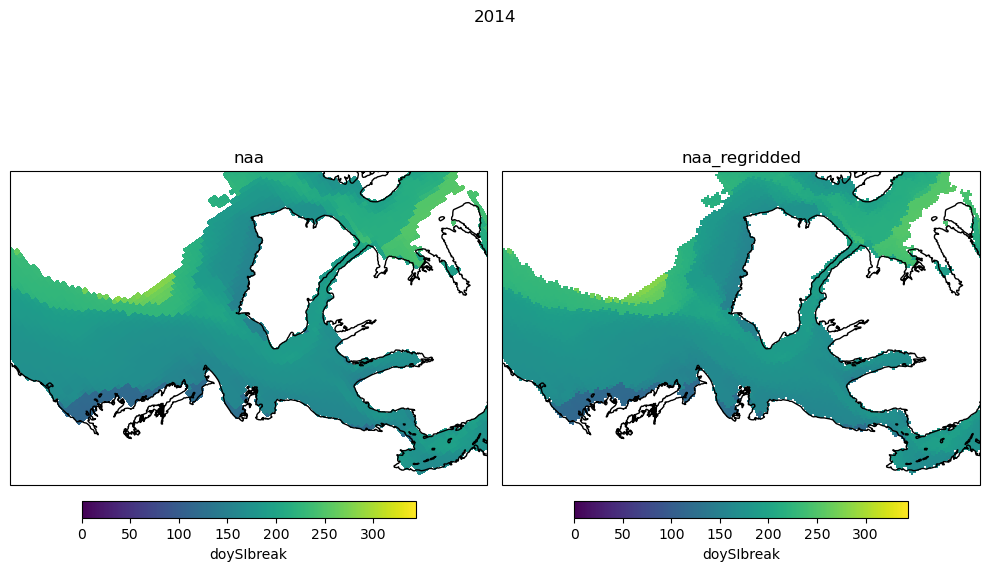

In [23]:
# VISUALIZE ORIGINAL VS REGRIDDED
y = 2014
v = 'sibd50' # sibd50, sibd85

plot_extent =  [-150,-100,67,85] # [-180,180,60,90] # [-140,-110,67,75] # >> you can change for regional focus
central_longitude = 0.5*(plot_extent[0]+plot_extent[1])
vmax = float(data[from_dataset][v].sel(year=y).max())

fig, axs = plt.subplots(ncols=2,figsize=(10,5),subplot_kw={'projection':ccrs.NorthPolarStereo(central_longitude=central_longitude)})
fig.suptitle(y)
for i,k in enumerate([from_dataset,f'{from_dataset}_regridded']):
    axs[i].coastlines()
    axs[i].set_title(k)
    axs[i].set_extent(plot_extent, ccrs.PlateCarree())
    pl = axs[i].pcolormesh(data[k].lon, data[k].lat, data[k][v].sel(year=y), transform=ccrs.PlateCarree(),vmin=0,vmax=vmax)
    plt.colorbar(pl, ax=axs[i],orientation='horizontal',label=v,shrink=0.7,pad=0.03)
fig.tight_layout()
plt.show()

##### VISUALIZE REGRIDDED VS ASMR

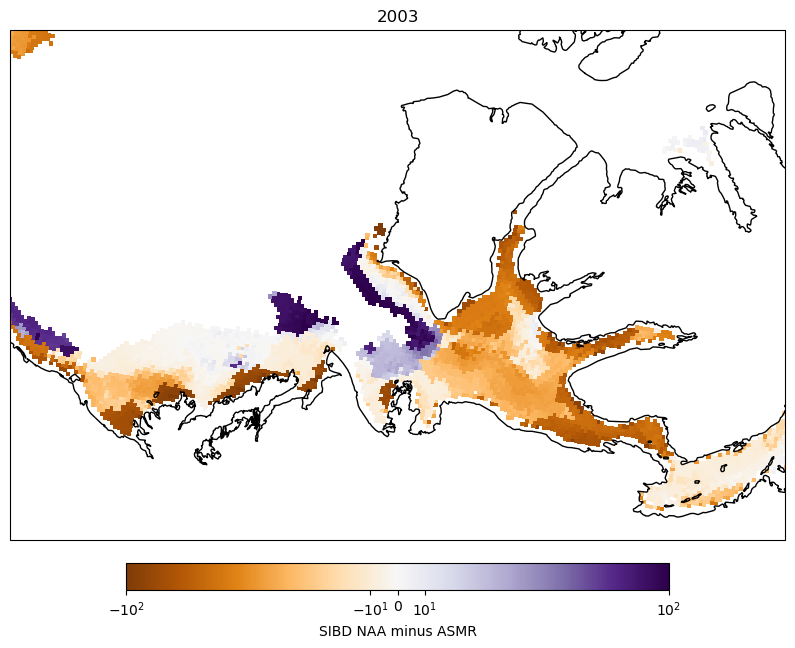

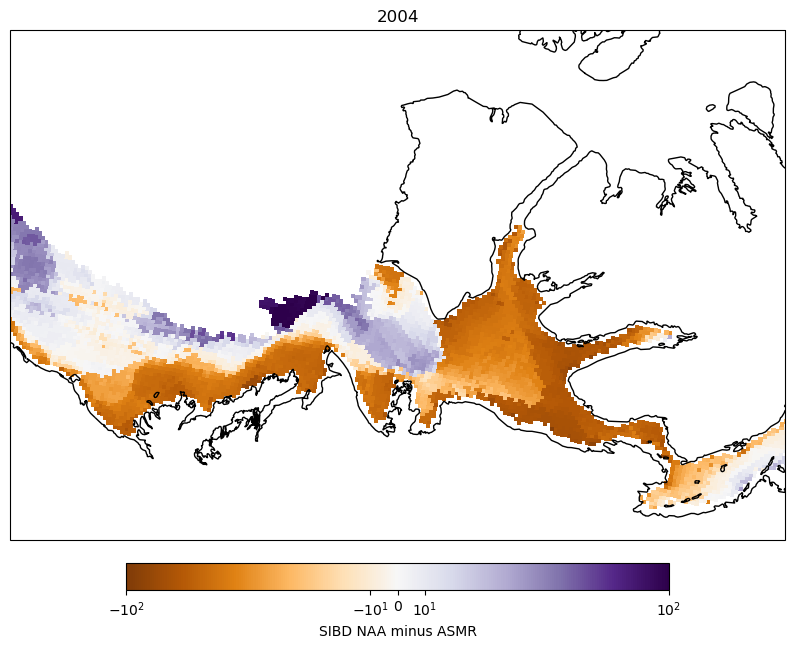

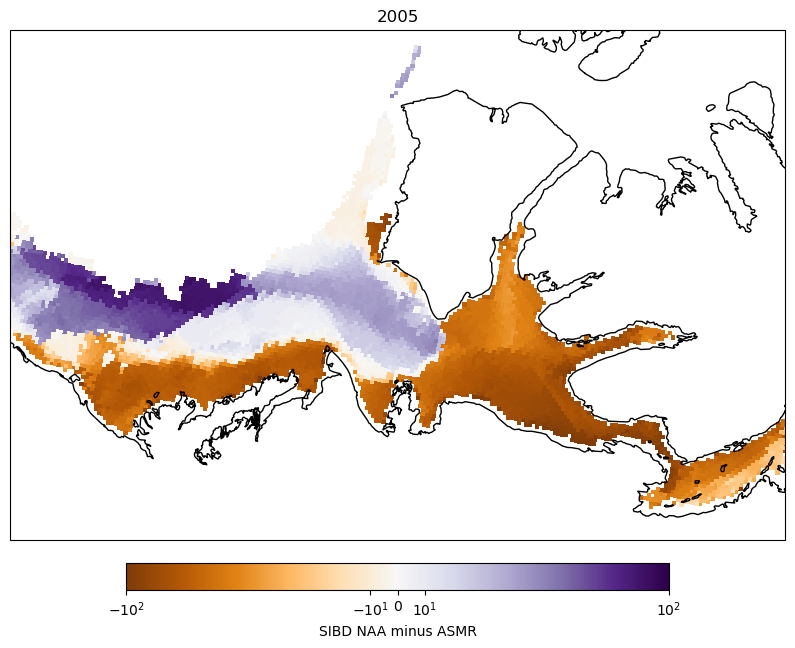

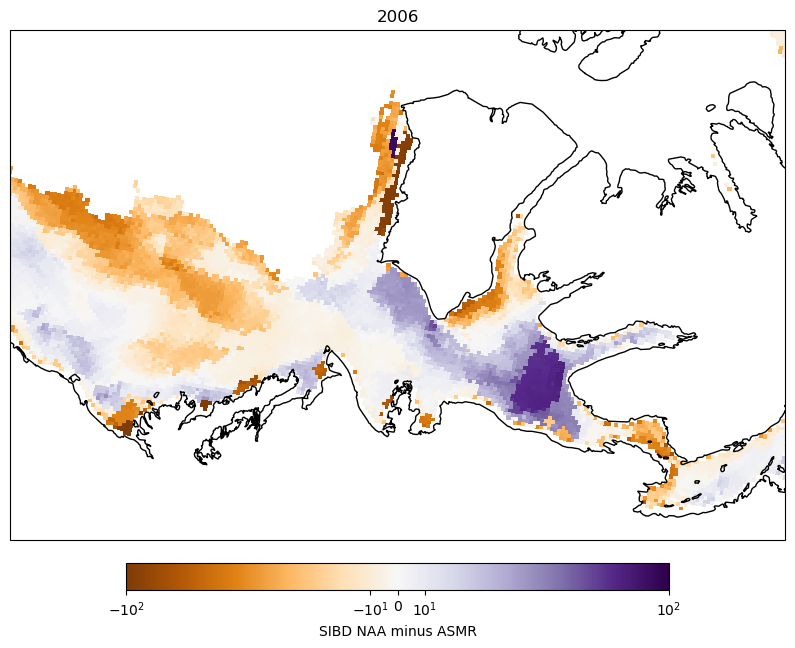

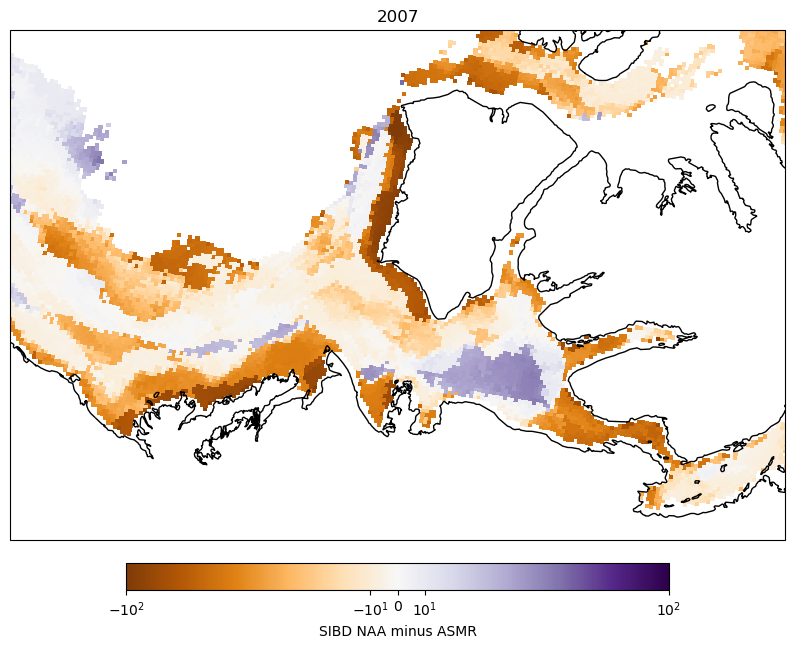

...

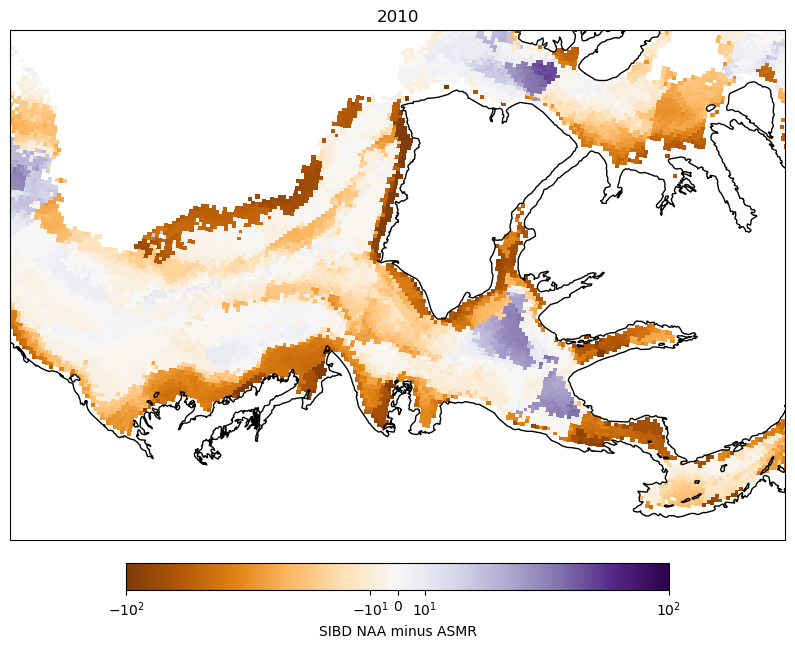

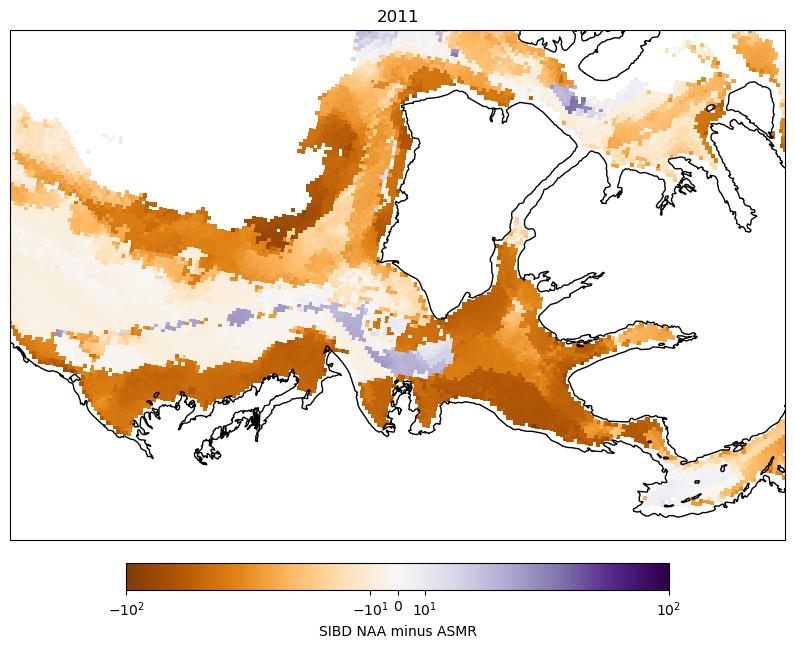

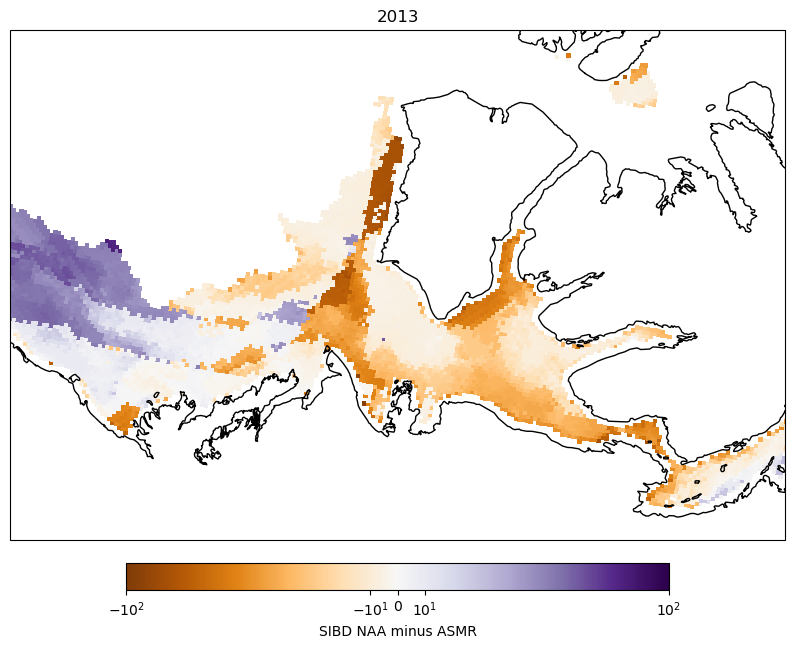

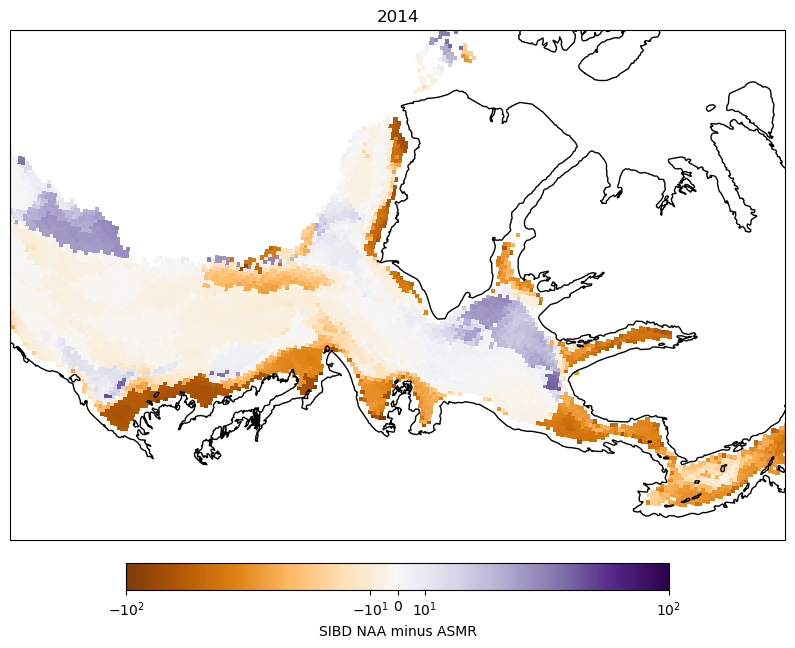

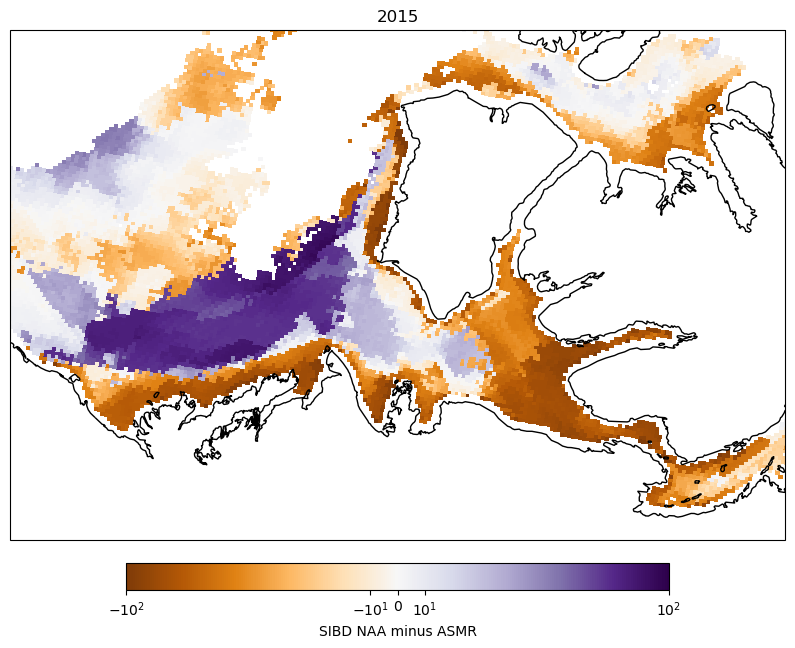

KeyError: "not all values found in index 'year'. Try setting the `method` keyword argument (example: method='nearest')."

In [24]:
# VISUALIZE REGRIDDED VS ASMR
y = 2014
v = 'sibd50' # sibd50, sibd85

z = (data['naa_regridded'] - data['asmr']).sel(year=y)
vmin,vmax = -100,100 # float(z.doySIbreak.min()),float(z.doySIbreak.max())

fig, ax = plt.subplots(figsize=(8,8),subplot_kw={'projection':ccrs.NorthPolarStereo(central_longitude=central_longitude)})
ax.coastlines()
ax.set_title(y)
ax.set_extent(plot_extent, ccrs.PlateCarree())
pl = ax.pcolormesh(z.lon, z.lat, z[v], transform=ccrs.PlateCarree(),cmap='PuOr',vmin=vmin,vmax=vmax) #norm=SymLogNorm(linthresh=10, linscale=0.1, vmin=vmin,vmax=vmax))
plt.colorbar(pl, ax=ax,orientation='horizontal', label='SIBD NAA minus ASMR',shrink=0.7,pad=0.03)
plt.show()